# Sample Comparison: All Methods

Single-sample comparison on training block `338`:

- methods as columns
- IPF `X / Y / Z` as separate rows
- one combined display instead of scattered plots
- relevant metrics as rows
- separate misorientation histograms for each method in one row


In [41]:
# ── GPU Selection: pick the GPU with the most free memory ──────────────────
import os
import subprocess

os.environ.setdefault("CUDA_DEVICE_ORDER", "PCI_BUS_ID")
SELECTED_CUDA_DEVICE_INDEX = None


def _pick_most_free_gpu():
    try:
        result = subprocess.run(
            [
                "nvidia-smi",
                "--query-gpu=index,memory.free",
                "--format=csv,noheader,nounits",
            ],
            check=True,
            capture_output=True,
            text=True,
        )
    except Exception as exc:
        print(f"GPU auto-select skipped: {exc}")
        return None

    rows = []
    for line in result.stdout.strip().splitlines():
        parts = [part.strip() for part in line.split(",")]
        if len(parts) < 2:
            continue
        idx_text, free_text = parts[:2]
        if idx_text.isdigit() and free_text.isdigit():
            rows.append((int(free_text), int(idx_text)))

    if not rows:
        print("GPU auto-select skipped: no GPUs reported by nvidia-smi")
        return None

    free_mb, gpu_idx = max(rows)
    print(f"Using GPU {gpu_idx} with {free_mb} MiB free")
    return gpu_idx


SELECTED_CUDA_DEVICE_INDEX = _pick_most_free_gpu()

if "torch" in globals() and SELECTED_CUDA_DEVICE_INDEX is not None and torch.cuda.is_available():
    try:
        torch.cuda.set_device(SELECTED_CUDA_DEVICE_INDEX)
        print(f"torch already imported; switched current device to cuda:{SELECTED_CUDA_DEVICE_INDEX}")
        print("Re-run Section 1 and later cells so they use the selected GPU explicitly.")
    except Exception as exc:
        print(f"Could not switch torch CUDA device: {exc}")


Using GPU 2 with 40322 MiB free
torch already imported; switched current device to cuda:2
Re-run Section 1 and later cells so they use the selected GPU explicitly.


In [42]:
# ── Section 1: Setup ─────────────────────────────────────────────────────────
import os
import sys
from pathlib import Path
from collections import OrderedDict

os.environ.setdefault("MPLCONFIGDIR", "/tmp/matplotlib")
os.environ.setdefault("NUMBA_CACHE_DIR", "/tmp/numba")
os.environ.setdefault("PYTORCH_CUDA_ALLOC_CONF", "expandable_segments:True")

import numpy as np
import pandas as pd
import cv2
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter

repo_root = Path.cwd()
if not (repo_root / "training").exists():
    for p in [Path.cwd(), *Path.cwd().parents]:
        if (p / "training").exists():
            repo_root = p
            break
if str(repo_root) not in sys.path:
    sys.path.insert(0, str(repo_root))

analysis_dir = str(repo_root / "analysis")
if analysis_dir not in sys.path:
    sys.path.insert(0, analysis_dir)

from training.config_utils import load_and_prepare_config
from inference import infer_iso_embedding_sr_attn as inf
from models.bicubic_f_interpolate_sr import QuaternionBicubicFInterpolateSR
from utils.symmetry_utils import resolve_symmetry
from utils import reduce_to_fz_min_angle
from visualization.ipf_render import render_ipf_rgb

try:
    from skimage.metrics import structural_similarity as sk_ssim
    SKIMAGE_AVAILABLE = True
except ImportError:
    sk_ssim = None
    SKIMAGE_AVAILABLE = False

selected_gpu = globals().get("SELECTED_CUDA_DEVICE_INDEX", None)
if torch.cuda.is_available():
    if selected_gpu is None:
        selected_gpu = torch.cuda.current_device()
    device = torch.device(f"cuda:{int(selected_gpu)}")
    torch.cuda.set_device(device)
else:
    device = torch.device("cpu")
sym = resolve_symmetry("Oh")

print("repo_root:", repo_root)
print("device:", device)
if device.type == "cuda":
    print("cuda_device_name:", torch.cuda.get_device_name(device))
print("symmetry:", getattr(sym, "name", "Oh"))


repo_root: /data/home/umang/Materials/Reynolds-QSR_4x1
device: cuda:2
cuda_device_name: NVIDIA A100-PCIE-40GB
symmetry: m-3m


In [43]:
# ── Section 2: Quaternion + metric helpers (matching metrics notebook) ─────
def normalize_quat(q, eps=1e-12):
    q = np.asarray(q, dtype=np.float64)
    if q.size == 0:
        return q
    if q.shape[-1] != 4:
        raise ValueError("Quaternion arrays must have last axis size 4")
    n = np.linalg.norm(q.reshape(-1, 4), axis=1).reshape(q.shape[:-1] + (1,))
    return q / (n + eps)


def quat_conjugate(q):
    q = np.asarray(q)
    return q * np.array([1.0, -1.0, -1.0, -1.0])


def quat_mul(a, b):
    a = np.asarray(a)
    b = np.asarray(b)
    if a.shape[-1] != 4 or b.shape[-1] != 4:
        raise ValueError("Input quaternions must have shape (..., 4)")
    w1, x1, y1, z1 = a[..., 0], a[..., 1], a[..., 2], a[..., 3]
    w2, x2, y2, z2 = b[..., 0], b[..., 1], b[..., 2], b[..., 3]
    w = w1 * w2 - x1 * x2 - y1 * y2 - z1 * z2
    x = w1 * x2 + x1 * w2 + y1 * z2 - z1 * y2
    y = w1 * y2 - x1 * z2 + y1 * w2 + z1 * x2
    z = w1 * z2 + x1 * y2 - y1 * x2 + z1 * w2
    return np.stack((w, x, y, z), axis=-1)


def crystallographic_misorientation(q_pred, q_gt, sym_quats=None, degrees=True):
    q_pred = np.asarray(q_pred, dtype=np.float64)
    q_gt = np.asarray(q_gt, dtype=np.float64)

    if q_pred.shape[-1] != 4 or q_gt.shape[-1] != 4:
        raise ValueError("Input quaternions must have last axis length 4")

    q_pred = normalize_quat(q_pred)
    q_gt = normalize_quat(q_gt)

    if sym_quats is None:
        sym_qs = None
    elif isinstance(sym_quats, str):
        sym_qs = np.asarray(resolve_symmetry(sym_quats).data, dtype=np.float64)
    elif hasattr(sym_quats, "data"):
        sym_qs = np.asarray(sym_quats.data, dtype=np.float64)
    elif hasattr(sym_quats, "to_quaternion"):
        sym_qs = np.asarray(sym_quats.to_quaternion(), dtype=np.float64)
    elif isinstance(sym_quats, np.ndarray):
        sym_qs = np.asarray(sym_quats, dtype=np.float64)
        if sym_qs.ndim != 2 or sym_qs.shape[1] != 4:
            raise ValueError("sym_quats numpy array must have shape (G, 4)")
    else:
        raise ValueError("Unknown sym_quats type")

    shape = q_pred.shape[:-1]
    qp = q_pred.reshape(-1, 4)
    qg = q_gt.reshape(-1, 4)

    if sym_qs is None:
        dots = np.abs(np.sum(qp * qg, axis=-1))
        dots = np.clip(dots, -1.0, 1.0)
        ang = 2.0 * np.arccos(dots)
        if degrees:
            ang = np.degrees(ang)
        return ang.reshape(shape)

    ops = sym_qs.copy()
    ops[:, 1:] *= -1.0
    gq = quat_mul(ops[:, None, :], qg[None, :, :])
    dots = np.abs(np.sum(gq * qp[None, :, :], axis=-1))
    dots = np.clip(dots, -1.0, 1.0)
    ang = 2.0 * np.arccos(dots)
    min_ang = np.min(ang, axis=0)
    if degrees:
        min_ang = np.degrees(min_ang)
    return min_ang.reshape(shape)


def misorientation_map(pred_q, gt_q, sym_quats=None, degrees=True):
    return crystallographic_misorientation(pred_q, gt_q, sym_quats=sym_quats, degrees=degrees)


def quaternion_mean(qs):
    qs = np.asarray(qs, dtype=np.float64).reshape(-1, 4)
    qs = normalize_quat(qs)
    M = np.dot(qs.T, qs)
    w, v = np.linalg.eigh(M)
    avg = v[:, np.argmax(w)]
    if avg[0] < 0:
        avg = -avg
    return normalize_quat(avg)


def compute_grod(ori_map, grain_labels=None, sym_ops=None, window_size=21):
    ori_map = np.asarray(ori_map, dtype=np.float64)
    H, W = ori_map.shape[:2]
    if grain_labels is not None:
        labels = np.asarray(grain_labels)
        grod = np.zeros((H, W), dtype=np.float64)
        grain_stats = {}
        for lab in np.unique(labels):
            mask = labels == lab
            if np.count_nonzero(mask) == 0:
                continue
            qs = ori_map[mask]
            mean_q = quaternion_mean(qs)
            grod_vals = crystallographic_misorientation(
                qs, np.tile(mean_q, (qs.shape[0], 1)), sym_quats=sym_ops, degrees=True
            )
            grod[mask] = grod_vals
            grain_stats[int(lab)] = {
                "mean": float(np.nanmean(grod_vals)),
                "max": float(np.nanmax(grod_vals)),
                "std": float(np.nanstd(grod_vals)),
                "count": int(qs.shape[0]),
            }
        return grod, grain_stats

    q = normalize_quat(ori_map)
    M_local = np.zeros((H, W, 4, 4), dtype=np.float64)
    for i in range(4):
        for j in range(i, 4):
            arr = q[..., i] * q[..., j]
            local = uniform_filter(arr, size=window_size, mode="reflect")
            M_local[..., i, j] = local
            M_local[..., j, i] = local
    M_flat = M_local.reshape(-1, 4, 4)
    w, v = np.linalg.eigh(M_flat)
    avg = v[:, :, -1]
    signs = np.where(avg[:, 0] < 0, -1.0, 1.0).reshape(-1, 1)
    avg = (avg * signs).reshape(H, W, 4)
    avg = normalize_quat(avg)
    grod = crystallographic_misorientation(ori_map, avg, sym_quats=sym_ops, degrees=True)
    stats = {
        "mean": float(np.nanmean(grod)),
        "max": float(np.nanmax(grod)),
        "std": float(np.nanstd(grod)),
    }
    return grod, stats


def compute_kam(ori_map, grain_labels=None, radius=1, sym_ops=None, ignore_threshold_deg=15.0, ref_patch=None):
    if ref_patch is not None:
        ori_map = ref_patch

    ori_map = np.asarray(ori_map, dtype=np.float64)
    H, W = ori_map.shape[:2]
    neighbors = []
    for dy in range(-radius, radius + 1):
        for dx in range(-radius, radius + 1):
            if dy == 0 and dx == 0:
                continue
            neighbors.append((dy, dx))

    vals = np.zeros((len(neighbors), H, W), dtype=np.float64)
    for k, (dy, dx) in enumerate(neighbors):
        src_y0 = max(0, -dy)
        src_y1 = H - max(0, dy)
        src_x0 = max(0, -dx)
        src_x1 = W - max(0, dx)
        dst_y0 = max(0, dy)
        dst_y1 = H - max(0, -dy)
        dst_x0 = max(0, dx)
        dst_x1 = W - max(0, -dx)

        shifted = np.zeros_like(ori_map)
        shifted[dst_y0:dst_y1, dst_x0:dst_x1] = ori_map[src_y0:src_y1, src_x0:src_x1]

        vm = np.zeros((H, W), dtype=bool)
        vm[dst_y0:dst_y1, dst_x0:dst_x1] = True
        if grain_labels is not None:
            same_grain = np.zeros((H, W), dtype=bool)
            same_grain[dst_y0:dst_y1, dst_x0:dst_x1] = (
                grain_labels[dst_y0:dst_y1, dst_x0:dst_x1]
                == grain_labels[src_y0:src_y1, src_x0:src_x1]
            )
            vm = vm & same_grain

        mis = np.full((H, W), np.nan, dtype=np.float64)
        if np.any(vm):
            mis_vals = crystallographic_misorientation(
                ori_map[vm], shifted[vm], sym_quats=sym_ops, degrees=True
            )
            mis[vm] = mis_vals
        if ignore_threshold_deg is not None:
            mis[mis > ignore_threshold_deg] = np.nan
        vals[k] = mis

    kam = np.nanmean(vals, axis=0)
    stats = {
        "mean": float(np.nanmean(kam)),
        "max": float(np.nanmax(kam)),
        "std": float(np.nanstd(kam)),
    }
    return kam, stats


def _resolve_symmetry_quats(sym_quats):
    if sym_quats is None:
        return None
    if isinstance(sym_quats, str):
        return np.asarray(resolve_symmetry(sym_quats).data, dtype=np.float64)
    if hasattr(sym_quats, "data"):
        return np.asarray(sym_quats.data, dtype=np.float64)
    if hasattr(sym_quats, "to_quaternion"):
        return np.asarray(sym_quats.to_quaternion(), dtype=np.float64)
    arr = np.asarray(sym_quats, dtype=np.float64)
    if arr.ndim != 2 or arr.shape[1] != 4:
        raise ValueError("sym_quats numpy array must have shape (G, 4)")
    return arr


def max_misorientation_from_sym(sym_quats):
    sym_qs = _resolve_symmetry_quats(sym_quats)
    if sym_qs is None:
        return 180.0
    sym_qs = normalize_quat(sym_qs)
    max_angle = 0.0
    for i in range(len(sym_qs)):
        dots = np.abs(np.sum(sym_qs[i] * sym_qs, axis=-1))
        dots = np.clip(dots, -1.0, 1.0)
        max_angle = max(max_angle, float(np.max(2.0 * np.arccos(dots))))
    return float(np.degrees(max_angle))


def psnr_from_map(ref_map, test_map, max_val, eps=1e-10):
    ref_map = np.asarray(ref_map, dtype=np.float64)
    test_map = np.asarray(test_map, dtype=np.float64)
    mse = np.nanmean((ref_map - test_map) ** 2)
    if not np.isfinite(mse) or mse <= 0:
        return float("inf")
    return float(20.0 * np.log10(float(max_val) / np.sqrt(mse + eps)))


def ssim_from_map(ref_map, test_map, win_size=7, data_range=None):
    if not SKIMAGE_AVAILABLE or sk_ssim is None:
        return np.nan
    ref_map = np.asarray(ref_map, dtype=np.float64)
    test_map = np.asarray(test_map, dtype=np.float64)
    if data_range is None:
        data_range = float(
            np.nanmax([np.nanmax(ref_map), np.nanmax(test_map)])
            - np.nanmin([np.nanmin(ref_map), np.nanmin(test_map)])
        )
    if not np.isfinite(data_range) or data_range <= 0:
        return 1.0
    win_size = min(int(win_size), ref_map.shape[0], ref_map.shape[1])
    if win_size % 2 == 0:
        win_size -= 1
    win_size = max(win_size, 3)
    return float(
        sk_ssim(ref_map, test_map, data_range=float(data_range), win_size=win_size, channel_axis=None)
    )


def psnr_on_misorientation(pred_q, gt_q, sym_quats=None):
    mis = misorientation_map(pred_q, gt_q, sym_quats=sym_quats, degrees=True)
    return psnr_from_map(np.zeros_like(mis), mis, max_val=max_misorientation_from_sym(sym_quats))


def ssim_on_misorientation(pred_q, gt_q, sym_quats=None, win_size=7):
    mis = misorientation_map(pred_q, gt_q, sym_quats=sym_quats, degrees=True)
    return ssim_from_map(
        np.zeros_like(mis),
        mis,
        win_size=win_size,
        data_range=max_misorientation_from_sym(sym_quats),
    )


In [44]:
# ── Section 3: Load models + representative training sample ─────────────────
# Keep this aligned with metrics_sr_vs_hr_all.ipynb.
DATASET_DIR = Path("/data/home/umang/Materials/Materials_data_mount/datasets/IN718_QSR_4x1")
LR_FILE = DATASET_DIR / "Train" / "LR_Data" / "IN718_QSR_4x1_train_lr_x_block_338.npy"
HR_FILE = DATASET_DIR / "Train" / "HR_Data" / "IN718_QSR_4x1_train_hr_x_block_338.npy"

# "IN718_QSR_4x1_test_hr_z_block_11"
#LR_FILE = DATASET_DIR / "Test" / "LR_Data" / "IN718_QSR_4x1_test_lr_z_block_11.npy"
#HR_FILE = DATASET_DIR / "Test" / "HR_Data" / "IN718_QSR_4x1_test_hr_z_block_11.npy"

lr = np.load(LR_FILE).astype(np.float32)
hr = np.load(HR_FILE).astype(np.float32)

PATCH_ROWS = slice(50, 120)
PATCH_COLS = slice(50, 150)
hr_patch = hr[PATCH_ROWS, PATCH_COLS]
sample_scale = (int(hr.shape[0] // lr.shape[0]), int(hr.shape[1] // lr.shape[1]))


def _as_scale_tuple(scale_value):
    if isinstance(scale_value, (list, tuple)):
        return (int(scale_value[0]), int(scale_value[1]))
    scale_value = int(scale_value)
    return (scale_value, scale_value)


def _resolve_run_cfg_path(exp_dir):
    candidates = [
        exp_dir / "logs" / "inference_run_config.json",
        exp_dir / "logs" / "run_config.json",
    ]
    for path in candidates:
        if path.exists():
            return path
    raise FileNotFoundError(f"No run config found under {exp_dir / 'logs'}")


def _resolve_checkpoint_path(cfg_local, exp_dir, checkpoint_name="best_model.pt"):
    checkpoints_dir = Path(getattr(cfg_local, "checkpoints_dir", exp_dir / "checkpoints"))
    if checkpoint_name is not None:
        return inf._resolve_checkpoint(cfg_local, exp_dir, checkpoint_name)

    candidates = sorted(checkpoints_dir.glob("*.pt"))
    if not candidates:
        raise FileNotFoundError(f"No checkpoints found under {checkpoints_dir}")

    def _checkpoint_rank(path):
        name = path.name
        if name == "last_checkpoint.pt":
            return (3, 0)
        if name.startswith("epoch_") and name.endswith(".pt"):
            epoch_text = name[len("epoch_"):-len(".pt")]
            if epoch_text.isdigit():
                return (2, int(epoch_text))
        if name == "best_model.pt":
            return (1, 0)
        return (0, path.stat().st_mtime_ns)

    return max(candidates, key=_checkpoint_rank)


def _load_experiment_model(exp_dir, *, override_scale=None, checkpoint_name="best_model.pt"):
    cfg_path = exp_dir / "config_new.json"
    run_cfg_path = _resolve_run_cfg_path(exp_dir)
    assert cfg_path.exists(), f"Config missing: {cfg_path}"
    cfg_local = load_and_prepare_config(cfg_path, run_cfg_path)
    if override_scale is not None:
        override_scale = _as_scale_tuple(override_scale)
        original_scale = _as_scale_tuple(getattr(cfg_local, "upsample_factor", getattr(cfg_local, "scale", override_scale)))
        if original_scale != override_scale:
            print(f"Overriding {exp_dir.name} scale from {original_scale} to {override_scale} for this sample.")
        cfg_local.scale = list(override_scale)
        cfg_local.upsample_factor = list(override_scale)
    checkpoint = _resolve_checkpoint_path(cfg_local, exp_dir, checkpoint_name)
    assert checkpoint.exists(), f"Checkpoint missing: {checkpoint}"
    model_local = inf._load_model_from_checkpoint(cfg_local, checkpoint, device)
    return cfg_local, model_local, checkpoint


base_exp_dir = Path("/data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/iso_embedding_sr_attn_01")
cfg, model, checkpoint = _load_experiment_model(base_exp_dir, override_scale=sample_scale)

boundary_aware_exp_dir = Path(
    "/data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/iso_embedding_sr_attn_boundary_aware_01"
)
cfg_boundary_aware, model_boundary_aware, checkpoint_boundary_aware = _load_experiment_model(
    boundary_aware_exp_dir,
    override_scale=sample_scale,
    checkpoint_name=None,
)

print("Base model loaded:", type(model).__name__, "from", checkpoint)
print(
    "Boundary-aware model loaded:",
    type(model_boundary_aware).__name__,
    "from",
    checkpoint_boundary_aware,
)
sdf_one_sided_exp_dir = Path(
    "/data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/irrep_sdf_sr_one_sided_01"
)
cfg_sdf_one_sided, model_sdf_one_sided, checkpoint_sdf_one_sided = _load_experiment_model(
    sdf_one_sided_exp_dir,
    override_scale=sample_scale,
)
print(
    "SDF 1sided model loaded:",
    type(model_sdf_one_sided).__name__,
    "from",
    checkpoint_sdf_one_sided,
)
print("LR shape:", lr.shape)
print("HR shape:", hr.shape)
print("Patch shape:", hr_patch.shape)
print("Sample scale:", sample_scale)
# ── QRBSA (Q-RBSA 1D, no-irrep baseline) ────────────────────────────────────
_qrbsa_root = repo_root / "Q-RBSA"
for _p in [str(_qrbsa_root), str(_qrbsa_root / "model")]:
    if _p not in sys.path:
        sys.path.insert(0, _p)

from qrbsa_1d import QRBSA_1D  # noqa: E402
import json as _json
from types import SimpleNamespace as _SN

qrbsa_exp_dir = Path("/data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/qrbsa_01")
with open(qrbsa_exp_dir / "config.json") as _f:
    _qrbsa_cfg = _json.load(_f)

model_qrbsa = QRBSA_1D(_SN(
    n_colors=4,
    n_resblocks=_qrbsa_cfg.get("n_resblocks", 16),
    n_feats=_qrbsa_cfg.get("n_feats", 64),
    scale=_qrbsa_cfg.get("scale", 4),
)).to(device)

_qrbsa_ckpt_path = qrbsa_exp_dir / "checkpoints" / "best_model.pt"
_qrbsa_ckpt = torch.load(_qrbsa_ckpt_path, map_location=device)
model_qrbsa.load_state_dict(_qrbsa_ckpt["model_state_dict"])
model_qrbsa.eval()
print("QRBSA model loaded:", type(model_qrbsa).__name__, "from", _qrbsa_ckpt_path)


Using symmetry group from config: Oh
Overridden config values:
  - dataset_root: /data/home/umang/Materials/Materials_data_mount/datasets/IN718_QSR_4x1 (default: )
  - epochs: 150 (default: 10)
  - batch_size: 5 (default: 4)
  - scale: [4, 1] (default: 4)
  - symmetry_group: Oh (default: O)
  - use_lr_conv2: False (default: True)
  - num_hr_attn_blocks: 0 (default: 1)
  - hr_attn_num_channels: 4 (default: 8)
  - hr_attn_block_size: 32 (default: 16)
  - hr_attn_tp_out_chunk_size: 128 (default: 2048)
  - decoder_num_starts: 4 (default: 2)
  - decoder_steps: 30 (default: 1)
  - decoder_lr: 0.03 (default: 0.05)
  - num_workers: 8 (default: 0)
  - preload: True (default: False)
  - preload_torch: True (default: False)
  - min_free_cuda_gb: 4.0 (default: 0.0)
Using existing symmetry files for Oh
Saved resolved config to /data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/iso_embedding_sr_attn_01/logs/inference_run_config.json
Model: models.SR_double_conv_SRattn_a1.IsoEmbeddingSRAtt

SDF 1sided model loaded: IsoEmbeddingSRSDF from /data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/irrep_sdf_sr_one_sided_01/checkpoints/best_model.pt
LR shape: (64, 256, 4)
HR shape: (256, 256, 4)
Patch shape: (70, 100, 4)
Sample scale: (4, 1)


/tmp/ipykernel_2043436/1128653791.py:138: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  _qrbsa_ckpt = torch.load(_qrbsa_ckpt_path, map_location=device)


QRBSA model loaded: QRBSA_1D from /data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/qrbsa_01/checkpoints/best_model.pt


In [45]:
# ── Section 4: Model / bicubic / NN methods ─────────────────────────────────
def _hwc4(arr):
    arr = np.asarray(arr, dtype=np.float32)
    if arr.ndim != 3:
        raise ValueError(f"Expected rank-3 array, got {arr.shape}")
    if arr.shape[-1] == 4:
        return arr
    if arr.shape[0] == 4:
        return np.moveaxis(arr, 0, -1)
    raise ValueError(f"No axis of size 4 found in {arr.shape}")


model_bicubic_finterp = QuaternionBicubicFInterpolateSR(
    upsample_factor=sample_scale,
    align_corners=False,
    normalize_output=True,
    canonicalize_output=False,
    device=device,
).eval()


def upsample_model_sr(lr_q, out_hw):
    lr_q = _hwc4(lr_q)
    lr_t = torch.from_numpy(lr_q).to(device=device, dtype=torch.float32)
    lr_flat, lr_shape = inf._flatten_quat_chw(lr_t)
    with torch.enable_grad():
        sr_flat = model.forward_sr(lr_flat, lr_shape=lr_shape, normalize_input=True)
    return sr_flat.detach().cpu().numpy().reshape(int(out_hw[0]), int(out_hw[1]), 4)


def _compute_lr_boundary_map_torch(lr_q, angle_deg=5.0, mark_both_sides=True):
    q = torch.from_numpy(_hwc4(lr_q)).to(dtype=torch.float32)
    q = q / q.norm(dim=-1, keepdim=True).clamp_min(1e-8)
    h, w, _ = q.shape
    boundary = torch.zeros((h, w), dtype=torch.float32)
    theta = max(0.0, min(180.0, float(angle_deg)))
    cos_half = float(np.cos(np.deg2rad(0.5 * theta)))

    dot_x = (q[:, 1:, :] * q[:, :-1, :]).sum(dim=-1).abs().clamp(0.0, 1.0)
    dot_y = (q[1:, :, :] * q[:-1, :, :]).sum(dim=-1).abs().clamp(0.0, 1.0)
    b_x = (dot_x < cos_half).to(dtype=torch.float32)
    b_y = (dot_y < cos_half).to(dtype=torch.float32)

    if mark_both_sides:
        boundary[:, 1:] = torch.maximum(boundary[:, 1:], b_x)
        boundary[:, :-1] = torch.maximum(boundary[:, :-1], b_x)
        boundary[1:, :] = torch.maximum(boundary[1:, :], b_y)
        boundary[:-1, :] = torch.maximum(boundary[:-1, :], b_y)
    else:
        boundary[:, 1:] = torch.maximum(boundary[:, 1:], b_x)
        boundary[1:, :] = torch.maximum(boundary[1:, :], b_y)
    return boundary


def upsample_boundary_aware_model_sr(lr_q, out_hw):
    lr_q = _hwc4(lr_q)
    lr_t = torch.from_numpy(lr_q).to(device=device, dtype=torch.float32)
    lr_flat, lr_shape = inf._flatten_quat_chw(lr_t)
    lr_boundary = _compute_lr_boundary_map_torch(
        lr_q,
        angle_deg=float(getattr(cfg_boundary_aware, "lr_boundary_angle_deg", 5.0)),
        mark_both_sides=bool(getattr(cfg_boundary_aware, "lr_boundary_mark_both_sides", True)),
    ).to(device=device, dtype=torch.float32)
    with torch.enable_grad():
        sr_flat = model_boundary_aware.forward_sr(
            lr_flat,
            lr_shape=lr_shape,
            lr_boundary_map=lr_boundary,
            normalize_input=True,
        )
    sr_np = sr_flat.detach().cpu().numpy().reshape(int(out_hw[0]), int(out_hw[1]), 4)
    if sr_np.shape[:2] != (int(out_hw[0]), int(out_hw[1])):
        raise ValueError(
            f"Boundary-aware SR shape mismatch: got {sr_np.shape[:2]}, expected {(int(out_hw[0]), int(out_hw[1]))}"
        )
    return sr_np


def upsample_sdf_one_sided_sr(lr_q, out_hw):
    lr_q = _hwc4(lr_q)
    lr_t = torch.from_numpy(lr_q).to(device=device, dtype=torch.float32)
    lr_flat, lr_shape = inf._flatten_quat_chw(lr_t)
    with torch.enable_grad():
        sr_flat = model_sdf_one_sided.forward_sr(lr_flat, lr_shape=lr_shape, normalize_input=True)
    return sr_flat.detach().cpu().numpy().reshape(int(out_hw[0]), int(out_hw[1]), 4)

def upsample_qrbsa_sr(lr_q, out_hw):
    """Q-RBSA 1D with passive-external / active-internal convention handling."""
    lr_q = _hwc4(lr_q).astype(np.float32, copy=False)  # passive, scalar-first, (H, W, 4)
    lr_active = quat_conjugate(lr_q).astype(np.float32, copy=False)
    lr_t = torch.from_numpy(lr_active).to(device=device, dtype=torch.float32)
    lr_t = lr_t.permute(2, 0, 1).unsqueeze(0)  # (1, 4, H, W), active scalar-first
    lr_t = lr_t[:, [1, 2, 3, 0], :, :]  # active scalar-last for QRBSA
    with torch.no_grad():
        sr_t = model_qrbsa(lr_t)  # (1, 4, 4H, W), active scalar-last
    sr_t = sr_t[:, [3, 0, 1, 2], :, :]  # back to active scalar-first
    sr_t = torch.nn.functional.normalize(sr_t, p=2, dim=1)
    sr_active = sr_t.squeeze(0).permute(1, 2, 0).cpu().numpy().astype(np.float32, copy=False)
    sr_passive = quat_conjugate(sr_active).astype(np.float32, copy=False)
    sr_np = reduce_to_fz_min_angle(
        sr_passive,
        sym=sym,
        normalize=True,
        hemisphere=True,
        return_op_map=False,
    ).astype(np.float32, copy=False)
    if sr_np.shape[:2] != (int(out_hw[0]), int(out_hw[1])):
        raise ValueError(
            f"QRBSA SR shape mismatch: got {sr_np.shape[:2]}, expected {(int(out_hw[0]), int(out_hw[1]))}"
        )
    return sr_np


def upsample_bicubic(lr_q, out_hw):
    lr_q = _hwc4(lr_q)
    h_out, w_out = int(out_hw[0]), int(out_hw[1])
    sr = np.zeros((h_out, w_out, 4), dtype=np.float32)
    for i in range(4):
        sr[..., i] = cv2.resize(lr_q[..., i], (w_out, h_out), interpolation=cv2.INTER_CUBIC)
    norms = np.linalg.norm(sr, axis=-1, keepdims=True)
    norms[norms == 0] = 1.0
    return sr / norms


def upsample_bicubic_finterp(lr_q, out_hw):
    lr_q = _hwc4(lr_q)
    lr_t = torch.from_numpy(lr_q).to(device=device, dtype=torch.float32)
    lr_flat, lr_shape = inf._flatten_quat_chw(lr_t)
    with torch.no_grad():
        sr_flat = model_bicubic_finterp.forward_sr(
            lr_flat,
            lr_shape=lr_shape,
            normalize_input=False,
        )
    sr_np = sr_flat.detach().cpu().numpy().reshape(int(out_hw[0]), int(out_hw[1]), 4)
    if sr_np.shape[:2] != (int(out_hw[0]), int(out_hw[1])):
        raise ValueError(
            f"Torch bicubic SR shape mismatch: got {sr_np.shape[:2]}, expected {(int(out_hw[0]), int(out_hw[1]))}"
        )
    return sr_np.astype(np.float32, copy=False)


def upsample_iso_bicubic(lr_q, out_hw):
    lr_q = _hwc4(lr_q)
    h_lr, w_lr = lr_q.shape[:2]
    h_out, w_out = int(out_hw[0]), int(out_hw[1])

    lr_t = torch.from_numpy(lr_q.reshape(-1, 4)).to(device=device, dtype=torch.float32)
    with torch.no_grad():
        feat_lr = model.encode_a1(lr_t)
    c = feat_lr.shape[-1]
    feat_lr_hwc = feat_lr.cpu().numpy().reshape(h_lr, w_lr, c)

    feat_hr_hwc = np.zeros((h_out, w_out, c), dtype=np.float32)
    for i in range(c):
        feat_hr_hwc[..., i] = cv2.resize(
            feat_lr_hwc[..., i], (w_out, h_out), interpolation=cv2.INTER_CUBIC
        )

    feat_hr_flat = torch.from_numpy(feat_hr_hwc.reshape(h_out * w_out, c)).to(
        device=device, dtype=torch.float32
    )
    with torch.enable_grad():
        sr_t = model.decode(feat_hr_flat)
    return sr_t.detach().cpu().numpy().reshape(h_out, w_out, 4)


def upsample_nn(lr_q, out_hw):
    lr_q = _hwc4(lr_q)
    h_out, w_out = int(out_hw[0]), int(out_hw[1])
    sr = np.zeros((h_out, w_out, 4), dtype=np.float32)
    for i in range(4):
        sr[..., i] = cv2.resize(lr_q[..., i], (w_out, h_out), interpolation=cv2.INTER_NEAREST)
    norms = np.linalg.norm(sr, axis=-1, keepdims=True)
    norms[norms == 0] = 1.0
    return sr / norms


def upsample_iso_nn(lr_q, out_hw):
    lr_q = _hwc4(lr_q)
    h_lr, w_lr = lr_q.shape[:2]
    h_out, w_out = int(out_hw[0]), int(out_hw[1])

    lr_t = torch.from_numpy(lr_q.reshape(-1, 4)).to(device=device, dtype=torch.float32)
    with torch.no_grad():
        feat_lr = model.encode_a1(lr_t)
    c = feat_lr.shape[-1]
    feat_lr_hwc = feat_lr.cpu().numpy().reshape(h_lr, w_lr, c)

    feat_hr_hwc = np.zeros((h_out, w_out, c), dtype=np.float32)
    for i in range(c):
        feat_hr_hwc[..., i] = cv2.resize(
            feat_lr_hwc[..., i], (w_out, h_out), interpolation=cv2.INTER_NEAREST
        )

    feat_hr_flat = torch.from_numpy(feat_hr_hwc.reshape(h_out * w_out, c)).to(
        device=device, dtype=torch.float32
    )
    with torch.enable_grad():
        sr_t = model.decode(feat_hr_flat)
    return sr_t.detach().cpu().numpy().reshape(h_out, w_out, 4)


In [46]:
# ── Section 5: SLERP / Symm-SLERP methods ───────────────────────────────────
from slerp_final import (
    qnorm as torch_qnorm,
    slerp as torch_slerp,
    symmetrize_pair as torch_symmetrize_pair,
    make_fcc_symmetry_4x4,
)

interp_device = torch.device("cpu")
sym_ops_oh = make_fcc_symmetry_4x4(device=interp_device, dtype=torch.float32)


def upsample_slerp_quat_torch(lr_q, out_hw, *, sym_ops_4x4=None, device=interp_device):
    lr_q = _hwc4(lr_q)
    h_out, w_out = int(out_hw[0]), int(out_hw[1])

    x = torch.from_numpy(lr_q).permute(2, 0, 1).unsqueeze(0).to(device=device, dtype=torch.float32)
    x = torch_qnorm(x)
    B, C, H, W = x.shape

    sy = float(h_out) / float(H)
    sx = float(w_out) / float(W)

    iy = torch.arange(h_out, device=device, dtype=x.dtype)
    ix = torch.arange(w_out, device=device, dtype=x.dtype)
    y = (iy + 0.5) / sy - 0.5
    xcoord = (ix + 0.5) / sx - 0.5

    y0 = torch.floor(y).clamp(0, H - 1).long()
    x0 = torch.floor(xcoord).clamp(0, W - 1).long()
    y1 = (y0 + 1).clamp(0, H - 1)
    x1 = (x0 + 1).clamp(0, W - 1)

    v = (y - y0.to(x.dtype)).clamp(0.0, 1.0)
    u = (xcoord - x0.to(x.dtype)).clamp(0.0, 1.0)
    v_grid, u_grid = torch.meshgrid(v, u, indexing="ij")

    y0g = y0.view(h_out, 1).expand(h_out, w_out)
    y1g = y1.view(h_out, 1).expand(h_out, w_out)
    x0g = x0.view(1, w_out).expand(h_out, w_out)
    x1g = x1.view(1, w_out).expand(h_out, w_out)

    q00 = x[:, :, y0g, x0g]
    q01 = x[:, :, y0g, x1g]
    q10 = x[:, :, y1g, x0g]
    q11 = x[:, :, y1g, x1g]

    def flat(q):
        return q.permute(0, 2, 3, 1).reshape(-1, 4)

    q00_f, q01_f = flat(q00), flat(q01)
    q10_f, q11_f = flat(q10), flat(q11)
    u_full = u_grid.unsqueeze(0).expand(B, -1, -1).reshape(-1)
    v_full = v_grid.unsqueeze(0).expand(B, -1, -1).reshape(-1)

    if sym_ops_4x4 is None:
        q0u = torch_slerp(q00_f, q01_f, u_full)
        q1u = torch_slerp(q10_f, q11_f, u_full)
        q_uv = torch_slerp(q0u, q1u, v_full)
    else:
        sym_ops_4x4 = sym_ops_4x4.to(device=device, dtype=x.dtype)
        q00m, q01m = torch_symmetrize_pair(q00_f, q01_f, sym_ops_4x4)
        q0u = torch_slerp(q00m, q01m, u_full)
        q10m, q11m = torch_symmetrize_pair(q10_f, q11_f, sym_ops_4x4)
        q1u = torch_slerp(q10m, q11m, u_full)
        q0u_m, q1u_m = torch_symmetrize_pair(q0u, q1u, sym_ops_4x4)
        q_uv = torch_slerp(q0u_m, q1u_m, v_full)

    q_uv = torch_qnorm(q_uv)
    return q_uv.view(B, h_out, w_out, 4)[0].detach().cpu().numpy().astype(np.float32)


def upsample_slerp(lr_q, out_hw):
    return upsample_slerp_quat_torch(lr_q, out_hw, sym_ops_4x4=None, device=interp_device)


def upsample_symm_slerp(lr_q, out_hw):
    return upsample_slerp_quat_torch(lr_q, out_hw, sym_ops_4x4=sym_ops_oh, device=interp_device)


In [47]:
# ── Section 6: Boundary-Aware Sym-SLERP method ──────────────────────────────
from slerp_final import (
    bilinear_slerp_sym,
    qnorm as _qnorm_t,
    slerp as _slerp_t,
    symmetrize_pair,
)
from segment_grains import (
    segment_grains_graph,
    cleanup_small_grains_cuda,
    compute_gb_mask as _compute_gb_mask_t,
)

_ba_device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
_ba_sym_ops_cpu = make_fcc_symmetry_4x4(device="cpu", dtype=torch.float32)


@torch.no_grad()
def _build_smooth_hr_labels_aniso(labels_lr, scale_y, scale_x=1, sdf_shift=0.7):
    dev = labels_lr.device
    H, W = labels_lr.shape
    H_hr, W_hr = H * scale_y, W * scale_x

    gb_lr = _compute_gb_mask_t(labels_lr)
    gb_hr = F.interpolate(gb_lr[None, None], size=(H_hr, W_hr), mode="nearest")[0, 0]

    kernel = torch.ones((1, 1, 3, 3), device=dev) / 9.0
    dist = gb_hr.clone()
    for _ in range(12):
        dist = F.conv2d(dist[None, None], kernel, padding=1)[0, 0]

    sigma = 2.0
    ks = int(6 * sigma + 1) | 1
    half = ks // 2
    coords = torch.arange(ks, device=dev, dtype=torch.float32) - half
    g1 = torch.exp(-(coords ** 2) / (2 * sigma ** 2))
    g1 = g1 / g1.sum()
    g2 = torch.outer(g1, g1)[None, None]
    sdf_hr = F.conv2d(dist[None, None], g2, padding=half)[0, 0]
    sdf_hr = sdf_hr / (sdf_hr.max() + 1e-8)

    dy = torch.zeros_like(sdf_hr)
    dx = torch.zeros_like(sdf_hr)
    dy[1:-1, :] = 0.5 * (sdf_hr[2:, :] - sdf_hr[:-2, :])
    dy[0, :] = sdf_hr[1, :] - sdf_hr[0, :]
    dy[-1, :] = sdf_hr[-1, :] - sdf_hr[-2, :]
    dx[:, 1:-1] = 0.5 * (sdf_hr[:, 2:] - sdf_hr[:, :-2])
    dx[:, 0] = sdf_hr[:, 1] - sdf_hr[:, 0]
    dx[:, -1] = sdf_hr[:, -1] - sdf_hr[:, -2]
    norm = torch.sqrt(dx * dx + dy * dy + 1e-12)
    nx, ny = dx / norm, dy / norm

    idx_y = torch.arange(H_hr, device=dev, dtype=torch.float32)
    idx_x = torch.arange(W_hr, device=dev, dtype=torch.float32)
    y_base = (idx_y + 0.5) / scale_y - 0.5
    x_base = (idx_x + 0.5) / scale_x - 0.5
    y_grid, x_grid = torch.meshgrid(y_base, x_base, indexing="ij")

    y_nn = torch.round(y_grid - sdf_shift * ny).clamp(0, H - 1).long()
    x_nn = torch.round(x_grid - sdf_shift * nx).clamp(0, W - 1).long()
    return labels_lr[y_nn, x_nn].long()


@torch.no_grad()
def _analyze_boundary_cases_aniso(labels_lr, labels_hr, scale_y, scale_x=1):
    dev = labels_lr.device
    H_lr, W_lr = labels_lr.shape
    H_hr, W_hr = labels_hr.shape

    yy = torch.arange(H_hr, device=dev, dtype=torch.float32)
    xx = torch.arange(W_hr, device=dev, dtype=torch.float32)
    y_hr_g, x_hr_g = torch.meshgrid(yy, xx, indexing="ij")

    y_lr_f = (y_hr_g + 0.5) / scale_y - 0.5
    x_lr_f = (x_hr_g + 0.5) / scale_x - 0.5

    y0 = torch.floor(y_lr_f).long().clamp(0, H_lr - 1)
    x0 = torch.floor(x_lr_f).long().clamp(0, W_lr - 1)
    y1 = (y0 + 1).clamp(0, H_lr - 1)
    x1 = (x0 + 1).clamp(0, W_lr - 1)

    ty = (y_lr_f - y0.float()).clamp(0.0, 1.0)
    tx = (x_lr_f - x0.float()).clamp(0.0, 1.0)
    w_nb = torch.stack(
        [(1 - tx) * (1 - ty), tx * (1 - ty), (1 - tx) * ty, tx * ty], dim=-1
    )
    g_nb = torch.stack(
        [labels_lr[y0, x0], labels_lr[y0, x1], labels_lr[y1, x0], labels_lr[y1, x1]], dim=-1
    )
    same = g_nb == labels_hr.unsqueeze(-1)

    N = H_hr * W_hr
    sf = same.reshape(N, 4)
    wf = w_nb.reshape(N, 4)
    nv = sf.sum(dim=1)
    cf = torch.zeros(N, dtype=torch.uint8, device=dev)
    cf[nv == 4] = 3
    cf[(nv >= 2) & (nv < 4)] = 2
    cf[nv == 1] = 1
    return sf, wf, cf.view(H_hr, W_hr)


@torch.no_grad()
def _ba_slerp_core(q_lr_t, labels_lr, labels_hr, sym_ops_4x4,
                   scale_y, scale_x, same_mask_flat, w_flat, case_map):
    dev = q_lr_t.device
    dtype = q_lr_t.dtype
    _, _, H_lr, W_lr = q_lr_t.shape
    H_hr, W_hr = labels_hr.shape
    N = H_hr * W_hr

    yy = torch.arange(H_hr, device=dev, dtype=torch.float32)
    xx = torch.arange(W_hr, device=dev, dtype=torch.float32)
    y_g, x_g = torch.meshgrid(yy, xx, indexing="ij")
    y_lr_f = (y_g + 0.5) / scale_y - 0.5
    x_lr_f = (x_g + 0.5) / scale_x - 0.5

    y0 = torch.floor(y_lr_f).long().clamp(0, H_lr - 1)
    x0 = torch.floor(x_lr_f).long().clamp(0, W_lr - 1)
    y1 = (y0 + 1).clamp(0, H_lr - 1)
    x1 = (x0 + 1).clamp(0, W_lr - 1)
    u_f = (x_lr_f - x0.float()).clamp(0.0, 1.0).reshape(-1)
    v_f = (y_lr_f - y0.float()).clamp(0.0, 1.0).reshape(-1)

    q_hw = q_lr_t.squeeze(0).permute(1, 2, 0)
    q00_f = q_hw[y0, x0].reshape(N, 4)
    q01_f = q_hw[y0, x1].reshape(N, 4)
    q10_f = q_hw[y1, x0].reshape(N, 4)
    q11_f = q_hw[y1, x1].reshape(N, 4)
    q_nb = torch.stack([q00_f, q01_f, q10_f, q11_f], dim=1)

    cf = case_map.reshape(-1)
    gid_f = labels_hr.reshape(-1)
    y_est_f = y_lr_f.reshape(-1)
    x_est_f = x_lr_f.reshape(-1)
    q_out = torch.zeros((N, 4), dtype=dtype, device=dev)

    idx3 = (cf == 3).nonzero(as_tuple=False).squeeze(1)
    if idx3.numel() > 0:
        q_out[idx3] = bilinear_slerp_sym(
            q00_f[idx3], q01_f[idx3], q10_f[idx3], q11_f[idx3],
            u_f[idx3], v_f[idx3], sym_ops_4x4,
        )

    idx1 = (cf == 1).nonzero(as_tuple=False).squeeze(1)
    if idx1.numel() > 0:
        pos1 = same_mask_flat[idx1].long().argmax(dim=1)
        q_out[idx1] = q_nb[idx1, pos1]

    idx2 = (cf == 2).nonzero(as_tuple=False).squeeze(1)
    if idx2.numel() > 0:
        q_nb2 = q_nb[idx2]
        w2 = w_flat[idx2]
        same2 = same_mask_flat[idx2]
        for i in range(idx2.numel()):
            valid = same2[i].nonzero(as_tuple=False).squeeze(1)
            if valid.numel() == 0:
                continue
            qv = q_nb2[i, valid]
            wv = w2[i, valid] / (w2[i, valid].sum() + 1e-12)
            q_ref = qv[0:1]
            total_w = wv[0].clone()
            for k in range(1, valid.numel()):
                alpha = wv[k] / (total_w + wv[k] + 1e-12)
                q_ref, q_nxt = symmetrize_pair(q_ref, qv[k:k + 1], sym_ops_4x4)
                q_ref = _slerp_t(
                    q_ref, q_nxt, torch.tensor([float(alpha)], device=dev, dtype=dtype)
                )
                total_w = total_w + wv[k]
            q_out[idx2[i]] = q_ref[0]

    idx0 = (cf == 0).nonzero(as_tuple=False).squeeze(1)
    if idx0.numel() > 0:
        lab_cpu = labels_lr.cpu()
        q_hw_cpu = q_hw.cpu()
        for j in idx0.tolist():
            gid = int(gid_f[j].item())
            ye = int(round(float(y_est_f[j].item())))
            xe = int(round(float(x_est_f[j].item())))
            best_q = None
            for r in range(1, 4):
                if best_q is not None:
                    break
                for dy in range(-r, r + 1):
                    for dx in range(-r, r + 1):
                        yy_ = min(max(ye + dy, 0), H_lr - 1)
                        xx_ = min(max(xe + dx, 0), W_lr - 1)
                        if int(lab_cpu[yy_, xx_].item()) == gid:
                            best_q = q_hw_cpu[yy_, xx_]
                            break
                    if best_q is not None:
                        break
            if best_q is None:
                best_q = q_hw_cpu[min(max(ye, 0), H_lr - 1), min(max(xe, 0), W_lr - 1)]
            q_out[j] = _qnorm_t(best_q.to(dev, dtype).unsqueeze(0))[0]

    q_hr = _qnorm_t(q_out.view(H_hr, W_hr, 4).permute(2, 0, 1).unsqueeze(0))
    return q_hr


def upsample_ba_sym_slerp(lr_q, out_hw):
    lr_q = _hwc4(lr_q)
    q_lr_cpu = _qnorm_t(torch.from_numpy(lr_q).permute(2, 0, 1).unsqueeze(0).float())
    labels_np, _ = segment_grains_graph(q_lr_cpu, _ba_sym_ops_cpu, thr_deg=3.0)
    labels_lr = torch.from_numpy(labels_np).long()
    if torch.cuda.is_available():
        labels_lr = cleanup_small_grains_cuda(
            labels_lr.to(_ba_device), q_lr_cpu.to(_ba_device), _ba_sym_ops_cpu.to(_ba_device),
            min_pixels=3, max_iter=1,
        ).cpu()
    labels_hr = _build_smooth_hr_labels_aniso(labels_lr, 4, 1, sdf_shift=0.7)
    same_mask_flat, w_flat, case_map = _analyze_boundary_cases_aniso(labels_lr, labels_hr, 4, 1)
    q_hr = _ba_slerp_core(
        q_lr_cpu.to(_ba_device),
        labels_lr.to(_ba_device),
        labels_hr.to(_ba_device),
        _ba_sym_ops_cpu.to(_ba_device),
        4,
        1,
        same_mask_flat.to(_ba_device),
        w_flat.to(_ba_device),
        case_map.to(_ba_device),
    )
    return q_hr.squeeze(0).permute(1, 2, 0).cpu().numpy().astype(np.float32)


In [48]:
# ── Section 7: Methods registry + single-sample evaluation harness ──────────
METHODS = OrderedDict([
    ("Model SR", upsample_model_sr),
    ("Grain-Attention Boundary-aware SR", upsample_boundary_aware_model_sr),
    ("SDF 1sided SR", upsample_sdf_one_sided_sr),
    ("Bicubic", upsample_bicubic),
    ("Bicubic (F.interpolate)", upsample_bicubic_finterp),
    ("ISO Bicubic", upsample_iso_bicubic),
    ("NN", upsample_nn),
    ("ISO NN", upsample_iso_nn),
    ("SLERP", upsample_slerp),
    ("Symm-SLERP", upsample_symm_slerp),
    ("BA Sym-SLERP", upsample_ba_sym_slerp),
    ("QRBSA", upsample_qrbsa_sr),
])

print("Methods:", list(METHODS.keys()))


def run_all_methods(lr_q, hr_q, methods=METHODS, patch_rows=PATCH_ROWS, patch_cols=PATCH_COLS, sym_ops=sym):
    hr_patch = hr_q[patch_rows, patch_cols]
    grod_hr, _ = compute_grod(hr_patch, sym_ops=sym_ops)
    kam_hr, _ = compute_kam(hr_patch, radius=1, sym_ops=sym_ops)
    max_mis_deg = max_misorientation_from_sym(sym_ops)
    mis_ref_patch = np.zeros(hr_patch.shape[:2], dtype=np.float64)
    hr_patch_stats = {
        "grod_mean": float(np.nanmean(grod_hr)),
        "grod_p90": float(np.nanpercentile(grod_hr, 90)),
        "kam_mean": float(np.nanmean(kam_hr)),
        "kam_p90": float(np.nanpercentile(kam_hr, 90)),
    }

    results = {}
    for name, fn in methods.items():
        print(f"Running {name}...", end=" ", flush=True)
        sr_full = fn(lr_q, hr_q.shape[:2])
        sr_patch = sr_full[patch_rows, patch_cols]
        grod, _ = compute_grod(sr_patch, sym_ops=sym_ops)
        kam, _ = compute_kam(sr_patch, radius=1, sym_ops=sym_ops)
        mis_patch = crystallographic_misorientation(sr_patch, hr_patch, sym_quats=sym_ops, degrees=True)

        grod_delta = grod - grod_hr
        kam_delta = kam - kam_hr

        mis_stats = {
            "mean": float(np.nanmean(mis_patch)),
            "median": float(np.nanmedian(mis_patch)),
            "p90": float(np.nanpercentile(mis_patch, 90)),
            "psnr": psnr_from_map(mis_ref_patch, mis_patch, max_val=max_mis_deg),
            "ssim": ssim_from_map(mis_ref_patch, mis_patch, win_size=7, data_range=max_mis_deg),
        }

        grod_mean = float(np.nanmean(grod))
        grod_stats = {
            "mean": grod_mean,
            "std": float(np.nanstd(grod)),
            "p90": float(np.nanpercentile(grod, 90)),
            "hr_mean": hr_patch_stats["grod_mean"],
            "mean_diff": float(grod_mean - hr_patch_stats["grod_mean"]),
            "abs_mean_diff": float(abs(grod_mean - hr_patch_stats["grod_mean"])),
        }

        kam_mean = float(np.nanmean(kam))
        kam_stats = {
            "mean": kam_mean,
            "std": float(np.nanstd(kam)),
            "p90": float(np.nanpercentile(kam, 90)),
            "hr_mean": hr_patch_stats["kam_mean"],
            "mean_diff": float(kam_mean - hr_patch_stats["kam_mean"]),
            "abs_mean_diff": float(abs(kam_mean - hr_patch_stats["kam_mean"])),
        }

        results[name] = {
            "sr_full": sr_full,
            "sr_patch": sr_patch,
            "mis_patch": mis_patch,
            "mis_stats": mis_stats,
            "grod": grod,
            "grod_delta": grod_delta,
            "grod_stats": grod_stats,
            "kam": kam,
            "kam_delta": kam_delta,
            "kam_stats": kam_stats,
        }
        print(
            f"mis_mean={mis_stats['mean']:.3f}°, "
            f"PSNR={mis_stats['psnr']:.2f} dB, "
            f"SSIM={mis_stats['ssim']:.4f}, "
            f"|grodΔ|={grod_stats['abs_mean_diff']:.3f}°, "
            f"|kamΔ|={kam_stats['abs_mean_diff']:.3f}°"
        )

    if "Bicubic" in results and "Bicubic (F.interpolate)" in results:
        bic_cv = results["Bicubic"]["sr_patch"]
        bic_fi = results["Bicubic (F.interpolate)"]["sr_patch"]
        bic_backend_mis = crystallographic_misorientation(
            bic_cv,
            bic_fi,
            sym_quats=sym_ops,
            degrees=True,
        )
        bic_backend_summary = {
            "mean": float(np.nanmean(bic_backend_mis)),
            "median": float(np.nanmedian(bic_backend_mis)),
            "p90": float(np.nanpercentile(bic_backend_mis, 90)),
            "max": float(np.nanmax(bic_backend_mis)),
            "mean_abs_component_diff": float(np.mean(np.abs(bic_cv - bic_fi))),
        }
        results["__bicubic_backend_comparison__"] = {
            "mis_patch": bic_backend_mis,
            "summary": bic_backend_summary,
        }
        print(
            "OpenCV Bicubic vs F.interpolate Bicubic: "
            f"mean={bic_backend_summary['mean']:.4f}°, "
            f"p90={bic_backend_summary['p90']:.4f}°, "
            f"max={bic_backend_summary['max']:.4f}°, "
            f"mean_abs_component_diff={bic_backend_summary['mean_abs_component_diff']:.6f}"
        )

    results["__hr_patch__"] = hr_patch
    results["__grod_hr__"] = grod_hr
    results["__kam_hr__"] = kam_hr
    results["__hr_patch_stats__"] = hr_patch_stats
    results["__max_mis_deg__"] = max_mis_deg
    return results


Methods: ['Model SR', 'Grain-Attention Boundary-aware SR', 'SDF 1sided SR', 'Bicubic', 'Bicubic (F.interpolate)', 'ISO Bicubic', 'NN', 'ISO NN', 'SLERP', 'Symm-SLERP', 'BA Sym-SLERP', 'QRBSA']


In [49]:
# ── Section 8: Run the comparison on training block 338 ─────────────────────
results = run_all_methods(lr, hr)
print("Done.")


Running Model SR... mis_mean=0.606°, PSNR=47.98 dB, SSIM=0.8965, |grodΔ|=1.048°, |kamΔ|=0.539°
Running Grain-Attention Boundary-aware SR... mis_mean=0.688°, PSNR=46.27 dB, SSIM=0.8680, |grodΔ|=0.252°, |kamΔ|=0.276°
Running SDF 1sided SR... mis_mean=0.638°, PSNR=47.72 dB, SSIM=0.8864, |grodΔ|=7.247°, |kamΔ|=0.639°
Running Bicubic... mis_mean=9.217°, PSNR=21.93 dB, SSIM=0.0209, |grodΔ|=0.094°, |kamΔ|=4.097°
Running Bicubic (F.interpolate)... 

/tmp/ipykernel_2043436/485859235.py:190: RuntimeWarning: Mean of empty slice
  kam = np.nanmean(vals, axis=0)


mis_mean=9.217°, PSNR=21.93 dB, SSIM=0.0209, |grodΔ|=0.094°, |kamΔ|=4.097°
Running ISO Bicubic... mis_mean=0.781°, PSNR=45.70 dB, SSIM=0.8394, |grodΔ|=8.099°, |kamΔ|=0.142°
Running NN... mis_mean=0.669°, PSNR=45.83 dB, SSIM=0.8714, |grodΔ|=0.245°, |kamΔ|=0.177°
Running ISO NN... mis_mean=0.747°, PSNR=45.74 dB, SSIM=0.8496, |grodΔ|=6.953°, |kamΔ|=0.168°
Running SLERP... mis_mean=9.198°, PSNR=21.18 dB, SSIM=0.0255, |grodΔ|=0.638°, |kamΔ|=2.929°
Running Symm-SLERP... mis_mean=0.710°, PSNR=46.32 dB, SSIM=0.8618, |grodΔ|=0.378°, |kamΔ|=0.287°
Running BA Sym-SLERP... mis_mean=0.710°, PSNR=46.32 dB, SSIM=0.8618, |grodΔ|=0.378°, |kamΔ|=0.287°
Running QRBSA... mis_mean=1.719°, PSNR=39.39 dB, SSIM=0.5132, |grodΔ|=3.492°, |kamΔ|=1.156°
OpenCV Bicubic vs F.interpolate Bicubic: mean=0.0002°, p90=0.0002°, max=0.0002°, mean_abs_component_diff=0.000000
Done.


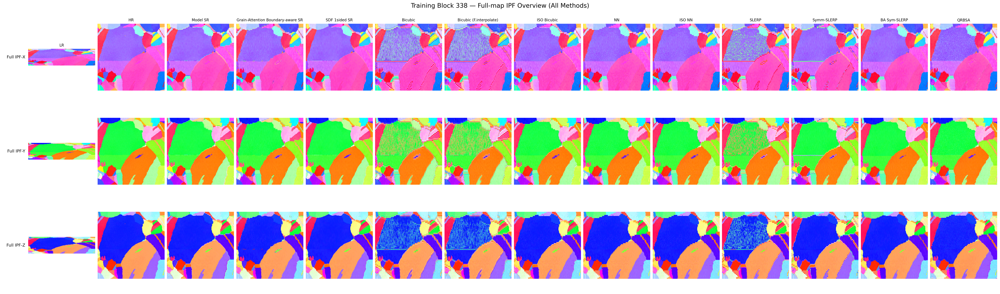

In [50]:
# ── Section 9b: Full-map IPF overview for all methods ───────────────────────
ref_dirs = ("X", "Y", "Z")
method_names = list(METHODS.keys())
col_labels = ["LR", "HR"] + method_names

full_maps = [
    dict(zip(ref_dirs, render_ipf_rgb(lr, sym))),
    dict(zip(ref_dirs, render_ipf_rgb(hr, sym))),
]
for name in method_names:
    full_maps.append(dict(zip(ref_dirs, render_ipf_rgb(results[name]["sr_full"], sym))))

n_cols = len(col_labels)
full_map_dpi = 220
fig = plt.figure(figsize=(2.4 * n_cols, 9.8), dpi=full_map_dpi, constrained_layout=True)
gs = fig.add_gridspec(
    3,
    n_cols + 1,
    width_ratios=[0.34] + [1] * n_cols,
)
fig.suptitle("Training Block 338 — Full-map IPF Overview (All Methods)", fontsize=15)

for r, rd in enumerate(ref_dirs):
    ax_label = fig.add_subplot(gs[r, 0])
    ax_label.axis("off")
    ax_label.text(0.98, 0.5, f"Full IPF-{rd}", ha="right", va="center", fontsize=10)

    for c, ipf_map in enumerate(full_maps, start=1):
        ax = fig.add_subplot(gs[r, c])
        ax.imshow(ipf_map[rd])
        ax.axis("off")
        if r == 0:
            ax.set_title(col_labels[c - 1], fontsize=9, pad=6)

plt.show()

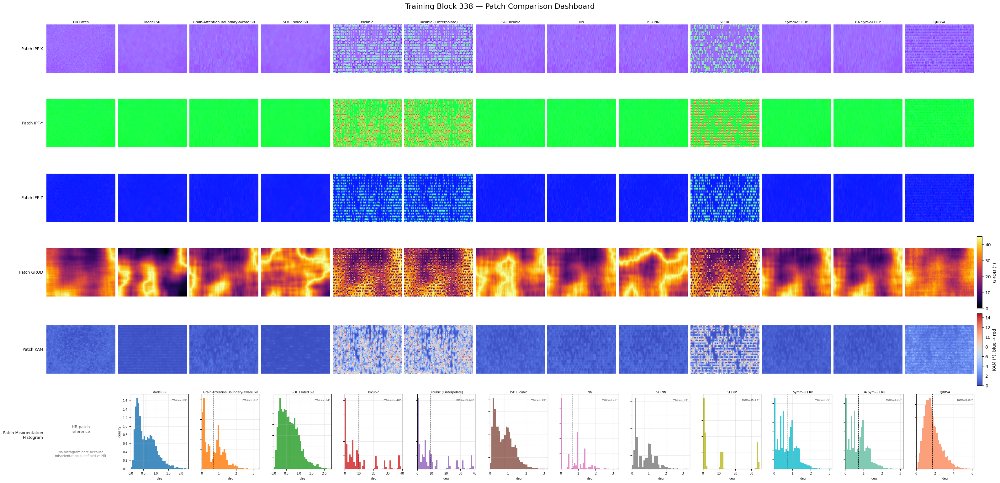

In [51]:
# ── Section 10: Combined patch dashboard (methods = columns, metrics = rows) ──
from matplotlib.colors import Normalize

method_names = list(METHODS.keys())
ref_dirs = ("X", "Y", "Z")
n_methods = len(method_names)
panel_names = ["HR Patch"] + method_names
n_data_cols = len(panel_names)

hr_patch = results["__hr_patch__"]
grod_hr = results["__grod_hr__"]
kam_hr = results["__kam_hr__"]

patch_ipf = {"HR Patch": dict(zip(ref_dirs, render_ipf_rgb(hr_patch, sym)))}
for name in method_names:
    patch_ipf[name] = dict(zip(ref_dirs, render_ipf_rgb(results[name]["sr_patch"], sym)))

vmax_grod = max([np.nanmax(grod_hr)] + [np.nanmax(results[n]["grod"]) for n in method_names])
vmax_kam = max([np.nanmax(kam_hr)] + [np.nanmax(results[n]["kam"]) for n in method_names])

row_labels = [
    "Patch IPF-X",
    "Patch IPF-Y",
    "Patch IPF-Z",
    "Patch GROD",
    "Patch KAM",
    "Patch Misorientation\nHistogram",
]

fig = plt.figure(
    figsize=(2.2 * (n_data_cols + 1.45), 15.3),
    constrained_layout=True,
)
gs = fig.add_gridspec(
    6,
    n_data_cols + 2,
    width_ratios=[0.48] + [1] * n_data_cols + [0.08],
    height_ratios=[1, 1, 1, 1, 1, 1.24],
)
fig.suptitle("Training Block 338 — Patch Comparison Dashboard", fontsize=17)

for r, label in enumerate(row_labels):
    ax_label = fig.add_subplot(gs[r, 0])
    ax_label.axis("off")
    ax_label.text(0.98, 0.5, label, ha="right", va="center", fontsize=9)

axes = []
for r in range(5):
    row_axes = []
    for c, panel_name in enumerate(panel_names, start=1):
        ax = fig.add_subplot(gs[r, c])
        ax.axis("off")
        if r == 0:
            ax.set_title(panel_name, fontsize=8, pad=4)
        row_axes.append(ax)
    axes.append(row_axes)

for ridx, rd in enumerate(ref_dirs):
    axes[ridx][0].imshow(patch_ipf["HR Patch"][rd])
    for c, name in enumerate(method_names, start=1):
        axes[ridx][c].imshow(patch_ipf[name][rd])

norm_grod = Normalize(vmin=0, vmax=vmax_grod)
for c in range(n_data_cols):
    data = grod_hr if c == 0 else results[method_names[c - 1]]["grod"]
    im_grod = axes[3][c].imshow(data, cmap="inferno", norm=norm_grod)
grod_cax = fig.add_subplot(gs[3, -1])
fig.colorbar(im_grod, cax=grod_cax, label="GROD (°)")

norm_kam = Normalize(vmin=0, vmax=vmax_kam)
for c in range(n_data_cols):
    data = kam_hr if c == 0 else results[method_names[c - 1]]["kam"]
    im_kam = axes[4][c].imshow(data, cmap="coolwarm", norm=norm_kam)
kam_cax = fig.add_subplot(gs[4, -1])
fig.colorbar(im_kam, cax=kam_cax, label="KAM (°), blue → red")

ax_hist_ref = fig.add_subplot(gs[5, 1])
ax_hist_ref.axis("off")
ax_hist_ref.text(0.5, 0.57, "HR patch\nreference", ha="center", va="center", fontsize=9, color="0.35")
ax_hist_ref.text(0.5, 0.29, "No histogram here because\nmisorientation is defined vs HR.", ha="center", va="center", fontsize=7.5, color="0.45")

hist_gs = gs[5, 2:n_data_cols + 1].subgridspec(1, n_methods, wspace=0.14)
hist_colors = list(plt.cm.tab10.colors) + list(plt.cm.Set2.colors)
for idx, name in enumerate(method_names):
    ax = fig.add_subplot(hist_gs[0, idx])
    m = results[name]["mis_patch"].ravel()
    m = m[~np.isnan(m)]
    m_max = float(np.nanmax(m)) if m.size else 1.0
    x_hi = max(1.0, m_max * 1.02)
    bins = np.linspace(0.0, x_hi, 41)
    ax.hist(
        m,
        bins=bins,
        density=True,
        color=hist_colors[idx % len(hist_colors)],
        alpha=0.84,
    )
    ax.axvline(np.nanmean(m), color="black", linestyle="--", linewidth=0.8)
    ax.grid(True, alpha=0.25)
    ax.set_xlim(0, x_hi)
    ax.tick_params(labelsize=7)
    ax.set_title(name, fontsize=7, pad=2)
    ax.set_xlabel("deg", fontsize=7)
    ax.text(
        0.98,
        0.94,
        f"max={m_max:.2f}°",
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=6.5,
        color="0.35",
    )
    if idx == 0:
        ax.set_ylabel("density", fontsize=7)
    else:
        ax.set_yticklabels([])

plt.show()


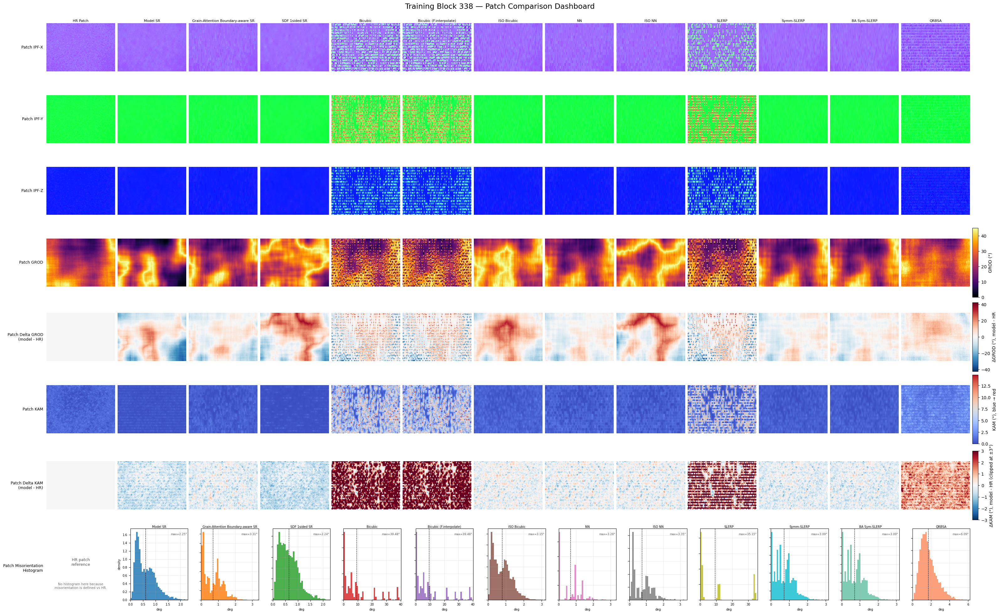

In [52]:
# ── Section 11: Combined patch dashboard (methods = columns, metrics = rows) ──
from matplotlib.colors import Normalize, TwoSlopeNorm

method_names = list(METHODS.keys())
ref_dirs = ("X", "Y", "Z")
n_methods = len(method_names)
panel_names = ["HR Patch"] + method_names
n_data_cols = len(panel_names)

hr_patch = results["__hr_patch__"]
grod_hr = results["__grod_hr__"]
kam_hr = results["__kam_hr__"]

patch_ipf = {"HR Patch": dict(zip(ref_dirs, render_ipf_rgb(hr_patch, sym)))}
for name in method_names:
    patch_ipf[name] = dict(zip(ref_dirs, render_ipf_rgb(results[name]["sr_patch"], sym)))

vmax_grod = max([np.nanmax(grod_hr)] + [np.nanmax(results[n]["grod"]) for n in method_names])
vmax_kam = max([np.nanmax(kam_hr)] + [np.nanmax(results[n]["kam"]) for n in method_names])
vmax_grod_delta = max(
    [0.0] + [float(np.nanmax(np.abs(results[n]["grod_delta"]))) for n in method_names]
 )
KAM_DELTA_PLOT_CLIP_DEG = 3.0

row_labels = [
    "Patch IPF-X",
    "Patch IPF-Y",
    "Patch IPF-Z",
    "Patch GROD",
    "Patch Delta GROD\n(model - HR)",
    "Patch KAM",
    "Patch Delta KAM\n(model - HR)",
    "Patch Misorientation\nHistogram",
]

fig = plt.figure(
    figsize=(2.2 * (n_data_cols + 1.45), 19.5),
    constrained_layout=True,
)
gs = fig.add_gridspec(
    8,
    n_data_cols + 2,
    width_ratios=[0.48] + [1] * n_data_cols + [0.08],
    height_ratios=[1, 1, 1, 1, 1, 1, 1, 1.24],
)
fig.suptitle("Training Block 338 — Patch Comparison Dashboard", fontsize=17)

for r, label in enumerate(row_labels):
    ax_label = fig.add_subplot(gs[r, 0])
    ax_label.axis("off")
    ax_label.text(0.98, 0.5, label, ha="right", va="center", fontsize=9)

axes = []
for r in range(7):
    row_axes = []
    for c, panel_name in enumerate(panel_names, start=1):
        ax = fig.add_subplot(gs[r, c])
        ax.axis("off")
        if r == 0:
            ax.set_title(panel_name, fontsize=8, pad=4)
        row_axes.append(ax)
    axes.append(row_axes)

for ridx, rd in enumerate(ref_dirs):
    axes[ridx][0].imshow(patch_ipf["HR Patch"][rd])
    for c, name in enumerate(method_names, start=1):
        axes[ridx][c].imshow(patch_ipf[name][rd])

norm_grod = Normalize(vmin=0, vmax=vmax_grod)
for c in range(n_data_cols):
    data = grod_hr if c == 0 else results[method_names[c - 1]]["grod"]
    im_grod = axes[3][c].imshow(data, cmap="inferno", norm=norm_grod)
grod_cax = fig.add_subplot(gs[3, -1])
fig.colorbar(im_grod, cax=grod_cax, label="GROD (°)")

norm_grod_delta = TwoSlopeNorm(vmin=-vmax_grod_delta, vcenter=0.0, vmax=vmax_grod_delta)
for c in range(n_data_cols):
    data = np.zeros_like(grod_hr) if c == 0 else results[method_names[c - 1]]["grod_delta"]
    im_grod_delta = axes[4][c].imshow(data, cmap="RdBu_r", norm=norm_grod_delta)
grod_delta_cax = fig.add_subplot(gs[4, -1])
fig.colorbar(im_grod_delta, cax=grod_delta_cax, label="ΔGROD (°), model - HR")

norm_kam = Normalize(vmin=0, vmax=vmax_kam)
for c in range(n_data_cols):
    data = kam_hr if c == 0 else results[method_names[c - 1]]["kam"]
    im_kam = axes[5][c].imshow(data, cmap="coolwarm", norm=norm_kam)
kam_cax = fig.add_subplot(gs[5, -1])
fig.colorbar(im_kam, cax=kam_cax, label="KAM (°), blue → red")

norm_kam_delta = TwoSlopeNorm(
    vmin=-KAM_DELTA_PLOT_CLIP_DEG,
    vcenter=0.0,
    vmax=KAM_DELTA_PLOT_CLIP_DEG,
)
for c in range(n_data_cols):
    data = (
        np.zeros_like(kam_hr)
        if c == 0
        else np.clip(
            results[method_names[c - 1]]["kam_delta"],
            -KAM_DELTA_PLOT_CLIP_DEG,
            KAM_DELTA_PLOT_CLIP_DEG,
        )
    )
    im_kam_delta = axes[6][c].imshow(data, cmap="RdBu_r", norm=norm_kam_delta)
kam_delta_cax = fig.add_subplot(gs[6, -1])
fig.colorbar(
    im_kam_delta,
    cax=kam_delta_cax,
    label=f"ΔKAM (°), model - HR (clipped at ±{KAM_DELTA_PLOT_CLIP_DEG:.0f}°)",
)

ax_hist_ref = fig.add_subplot(gs[7, 1])
ax_hist_ref.axis("off")
ax_hist_ref.text(0.5, 0.57, "HR patch\nreference", ha="center", va="center", fontsize=9, color="0.35")
ax_hist_ref.text(0.5, 0.29, "No histogram here because\nmisorientation is defined vs HR.", ha="center", va="center", fontsize=7.5, color="0.45")

hist_gs = gs[7, 2:n_data_cols + 1].subgridspec(1, n_methods, wspace=0.14)
hist_colors = list(plt.cm.tab10.colors) + list(plt.cm.Set2.colors)
for idx, name in enumerate(method_names):
    ax = fig.add_subplot(hist_gs[0, idx])
    m = results[name]["mis_patch"].ravel()
    m = m[~np.isnan(m)]
    m_max = float(np.nanmax(m)) if m.size else 1.0
    x_hi = max(1.0, m_max * 1.02)
    bins = np.linspace(0.0, x_hi, 41)
    ax.hist(
        m,
        bins=bins,
        density=True,
        color=hist_colors[idx % len(hist_colors)],
        alpha=0.84,
    )
    ax.axvline(np.nanmean(m), color="black", linestyle="--", linewidth=0.8)
    ax.grid(True, alpha=0.25)
    ax.set_xlim(0, x_hi)
    ax.tick_params(labelsize=7)
    ax.set_title(name, fontsize=7, pad=2)
    ax.set_xlabel("deg", fontsize=7)
    ax.text(
        0.98,
        0.94,
        f"max={m_max:.2f}°",
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=6.5,
        color="0.35",
    )
    if idx == 0:
        ax.set_ylabel("density", fontsize=7)
    else:
        ax.set_yticklabels([])

plt.show()


In [53]:
# ── Section 12: Patch scalar metrics summary ─────────────────────────────────
from IPython.display import display

method_names = list(METHODS.keys())

rows = []
for name in method_names:
    r = results[name]
    rows.append({
        "Method": name,
        "Mis mean": r["mis_stats"]["mean"],
        "Mis median": r["mis_stats"]["median"],
        "Mis p90": r["mis_stats"]["p90"],
        "PSNR mis": r["mis_stats"]["psnr"],
        "SSIM mis": r["mis_stats"]["ssim"],
        "GROD mean": r["grod_stats"]["mean"],
        "GROD std": r["grod_stats"]["std"],
        "mean|GROD - HR|": float(np.nanmean(np.abs(r["grod_delta"]))),
        "GROD p90": r["grod_stats"]["p90"],
        "KAM mean": r["kam_stats"]["mean"],
        "KAM std": r["kam_stats"]["std"],
        "mean|KAM - HR|": float(np.nanmean(np.abs(r["kam_delta"]))), 
        "KAM p90": r["kam_stats"]["p90"],
    })

df_summary = pd.DataFrame(rows).set_index("Method").T
metric_order = [
    "Mis mean",
    "Mis median",
    "Mis p90",
    "PSNR mis",
    "SSIM mis",
    "GROD mean",
    "GROD std",
    "mean|GROD - HR|",
    "GROD p90",
    "KAM mean",
    "KAM std",
    "mean|KAM - HR|",
    "KAM p90",
    
]
df_summary = df_summary.loc[metric_order]

metric_pref = {
    "Mis mean": "min",
    "Mis median": "min",
    "Mis p90": "min",
    "PSNR mis": "max",
    "SSIM mis": "max",
    "GROD mean": "min",
    "GROD std": "min",
    "mean|GROD - HR|": "min",
    "GROD p90": "min",
    "KAM mean": "min",
    "KAM std": "min",
    "mean|KAM - HR|": "min",
    "KAM p90": "min",
}

quick_rows = []
for metric in df_summary.index:
    vals = pd.to_numeric(df_summary.loc[metric], errors="coerce")
    direction = metric_pref[metric]
    if direction == "max":
        best_method = vals.idxmax()
        best_value = float(np.nanmax(vals.to_numpy(dtype=float)))
        better = "higher"
    elif direction == "absmin":
        best_method = np.abs(vals).idxmin()
        best_value = float(vals.loc[best_method])
        better = "closest to 0"
    else:
        best_method = vals.idxmin()
        best_value = float(np.nanmin(vals.to_numpy(dtype=float)))
        better = "lower"
    quick_rows.append({
        "Metric": metric,
        "Better": better,
        "Best method": best_method,
        "Best value": best_value,
    })
quick_read = pd.DataFrame(quick_rows).set_index("Metric")

reference_means = pd.DataFrame(
    {
        "HR patch": {
            "GROD mean": results["__hr_patch_stats__"]["grod_mean"],
            "KAM mean": results["__hr_patch_stats__"]["kam_mean"],
        }
    }
)

print("Patch scalar summary: lower is better except PSNR mis and SSIM mis, where higher is better.")
print("Rows 'GROD mean - HR' and 'KAM mean - HR' are signed deltas (model - HR), so closer to 0 is better.")
print("PSNR/SSIM are computed on the patch misorientation map against the zero-error reference, matching the metrics notebook.")
if not SKIMAGE_AVAILABLE:
    print("SSIM is unavailable because scikit-image is not installed in this kernel.")

display(
    reference_means.style
    .format("{:.3f}")
    .set_caption("HR patch reference means")
    .set_table_styles([
        {"selector": "caption", "props": [("caption-side", "top"), ("font-size", "12px"), ("font-weight", "600")]},
        {"selector": "th", "props": [("text-align", "center"), ("padding", "6px 10px"), ("background-color", "#f4f6f8")]},
        {"selector": "td", "props": [("text-align", "center"), ("padding", "6px 10px")]},
    ])
)

display(
    quick_read.style
    .format({"Best value": "{:.3f}"})
    .set_caption("Quick read: best-performing method by metric")
    .set_table_styles([
        {"selector": "caption", "props": [("caption-side", "top"), ("font-size", "12px"), ("font-weight", "600")]},
        {"selector": "th", "props": [("text-align", "center"), ("padding", "6px 10px"), ("background-color", "#f4f6f8")]},
        {"selector": "td", "props": [("text-align", "center"), ("padding", "6px 10px")]},
    ])
)


def _highlight_by_direction(row):
    vals = row.to_numpy(dtype=float)
    finite = np.isfinite(vals)
    if not np.any(finite):
        return [""] * len(vals)
    direction = metric_pref[row.name]
    if direction == "max":
        best = np.nanmax(vals)
        worst = np.nanmin(vals)
        key_vals = vals
    elif direction == "absmin":
        key_vals = np.abs(vals)
        best = np.nanmin(key_vals)
        worst = np.nanmax(key_vals)
    else:
        best = np.nanmin(vals)
        worst = np.nanmax(vals)
        key_vals = vals

    styles = []
    for i, v in enumerate(vals):
        if not np.isfinite(v):
            styles.append("color: #777777;")
        elif np.isclose(key_vals[i], best, equal_nan=False):
            styles.append("background-color: #e8f5e9; font-weight: 700; border: 2px solid #2e7d32;")
        elif np.isclose(key_vals[i], worst, equal_nan=False) and np.count_nonzero(finite) > 1:
            styles.append("background-color: #fdecea;")
        else:
            styles.append("")
    return styles


styled_summary = (
    df_summary.style
    .format("{:.3f}")
    .apply(_highlight_by_direction, axis=1)
    .set_caption("Patch scalar metrics summary")
    .set_table_styles([
        {"selector": "caption", "props": [("caption-side", "top"), ("font-size", "13px"), ("font-weight", "600")]},
        {"selector": "th", "props": [("text-align", "center"), ("padding", "6px 10px"), ("background-color", "#f4f6f8")]},
        {"selector": "td", "props": [("text-align", "center"), ("padding", "6px 10px")]},
    ])
)

display(styled_summary)

df_summary


Patch scalar summary: lower is better except PSNR mis and SSIM mis, where higher is better.
Rows 'GROD mean - HR' and 'KAM mean - HR' are signed deltas (model - HR), so closer to 0 is better.
PSNR/SSIM are computed on the patch misorientation map against the zero-error reference, matching the metrics notebook.


,HR patch
GROD mean,24.081
KAM mean,0.881


,Better,Best method,Best value
Metric,,,
Mis mean,lower,Model SR,0.606
Mis median,lower,Model SR,0.519
Mis p90,lower,Model SR,1.129
PSNR mis,higher,Model SR,47.982
SSIM mis,higher,Model SR,0.897
GROD mean,lower,Model SR,23.032
GROD std,lower,QRBSA,6.320
mean|GROD - HR|,lower,NN,3.587
GROD p90,lower,QRBSA,35.212


Method,Model SR,Grain-Attention Boundary-aware SR,SDF 1sided SR,Bicubic,Bicubic (F.interpolate),ISO Bicubic,NN,ISO NN,SLERP,Symm-SLERP,BA Sym-SLERP,QRBSA
Mis mean,0.606,0.688,0.638,9.217,9.217,0.781,0.669,0.747,9.198,0.710,0.710,1.719
Mis median,0.519,0.659,0.581,5.202,5.202,0.725,0.704,0.703,1.168,0.677,0.677,1.544
Mis p90,1.129,1.375,1.130,28.287,28.287,1.467,1.414,1.488,33.525,1.366,1.366,2.974
PSNR mis,47.982,46.267,47.721,21.931,21.931,45.698,45.829,45.739,21.176,46.317,46.317,39.394
SSIM mis,0.897,0.868,0.886,0.021,0.021,0.839,0.871,0.850,0.025,0.862,0.862,0.513
GROD mean,23.032,23.828,31.328,24.175,24.175,32.180,23.835,31.034,23.442,23.703,23.703,27.573
GROD std,12.807,10.024,7.775,11.393,11.393,8.790,10.009,8.372,11.261,10.204,10.204,6.320
mean|GROD - HR|,9.241,4.955,12.269,7.371,7.371,10.685,3.587,10.983,7.317,3.781,3.781,5.860
GROD p90,41.298,39.641,41.558,40.434,40.434,42.866,37.878,41.991,39.125,38.379,38.379,35.212
KAM mean,0.341,0.604,0.242,4.978,4.978,0.739,0.703,0.713,3.810,0.594,0.594,2.036


Method,Model SR,Grain-Attention Boundary-aware SR,SDF 1sided SR,Bicubic,Bicubic (F.interpolate),ISO Bicubic,NN,ISO NN,SLERP,Symm-SLERP,BA Sym-SLERP,QRBSA
Mis mean,0.606431,0.687745,0.638249,9.216963,9.216963,0.781006,0.669197,0.747178,9.197696,0.710434,0.710434,1.719334
Mis median,0.519126,0.659048,0.580767,5.202222,5.202221,0.725371,0.703592,0.703496,1.168444,0.677341,0.677341,1.543996
Mis p90,1.128625,1.374753,1.129849,28.286660,28.286660,1.467144,1.414201,1.488081,33.524818,1.366464,1.366464,2.974027
PSNR mis,47.982202,46.267295,47.720754,21.930897,21.930897,45.698115,45.828712,45.739286,21.176441,46.316918,46.316918,39.394261
SSIM mis,0.896530,0.868047,0.886441,0.020864,0.020864,0.839425,0.871411,0.849585,0.025483,0.861796,0.861796,0.513178
GROD mean,23.032162,23.828440,31.327745,24.174767,24.174767,32.179907,23.835276,31.033706,23.442107,23.703015,23.703015,27.572535
GROD std,12.806559,10.024440,7.775379,11.393222,11.393222,8.789699,10.008822,8.372409,11.260841,10.203784,10.203784,6.319984
mean|GROD - HR|,9.241036,4.954644,12.268671,7.371470,7.371470,10.684840,3.587155,10.983483,7.316614,3.781355,3.781355,5.860312
GROD p90,41.297562,39.641385,41.557651,40.433806,40.433806,42.865738,37.878064,41.991103,39.124747,38.378962,38.378965,35.211678
KAM mean,0.341478,0.604246,0.242180,4.978047,4.978047,0.738938,0.703463,0.712935,3.809541,0.594212,0.594212,2.036223


In [54]:
# ── Final cleanup: release GPU memory ─────────────────────────────────────
import gc

_moved_models = []
_deleted_names = []

for _name, _obj in list(globals().items()):
    if isinstance(_obj, torch.nn.Module):
        try:
            _obj.to(torch.device('cpu'))
            _moved_models.append(_name)
        except Exception:
            pass

for _name, _obj in list(globals().items()):
    if isinstance(_obj, torch.Tensor) and _obj.is_cuda:
        del globals()[_name]
        _deleted_names.append(_name)

for _name in [
    'results', 'full_maps', 'patch_ipf', 'df_summary', 'styled_summary',
    'sr_t', 'lr_t', 'hr_t', 'feat_lr', 'feat_hr_flat', 'sr_flat',
    'lr_active', 'sr_active', 'sr_passive', 'debug_payload'
]:
    if _name in globals():
        del globals()[_name]
        _deleted_names.append(_name)

plt.close('all')
gc.collect()
if torch.cuda.is_available():
    try:
        torch.cuda.empty_cache()
        torch.cuda.ipc_collect()
    except Exception:
        pass

print('Moved models to CPU:', sorted(set(_moved_models)))
print('Deleted GPU-heavy globals:', sorted(set(_deleted_names)))
print('CUDA cleanup complete.')


Moved models to CPU: ['model', 'model_bicubic_finterp', 'model_boundary_aware', 'model_qrbsa', 'model_sdf_one_sided']
Deleted GPU-heavy globals: ['df_summary', 'full_maps', 'patch_ipf', 'results', 'styled_summary']
CUDA cleanup complete.
